# Workflow to find a template image in a large orthomosaic


In [61]:
import shutil

from aiofiles.ospath import exists
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload



First the template needs to be found in the potentially arbitrary large image. Since the drone images are georeferenced and the orthomosaics the mosaic is cropped first by its rough location. Within the crop the drone is used as a template.

This is done by tiling the large image and then searching for the template in each tile. The results are then projected back to the large image.

In [62]:
# scenario = "Snt_STJB01"
scenario = "Snt_STJB06"
# scenario = "FCD01-02-03"
# scenario = "FMO04_tracking"

In [63]:
from pathlib import Path
from image_template_search.util.HastyAnnotationV2 import hA_from_file


if scenario == "FMO04_tracking":

    base_path = Path("/Users/christian/Library/CloudStorage/GoogleDrive-christian.winkelmann@gmail.com/My Drive/Datasets/IguanasFromAbove/Orthomosaics for quality analysis/FMO04")
    
    image_url = "https://app.hasty.ai/projects/9d8deceb-77be-47aa-978f-abcbdc8e00f2/image/4db0c13f-692b-4ae5-b4bc-591d314d87e6?datasetId=a37b5089-ece1-42c2-bf4d-db92d2dd3e6c"
    drone_image_path = base_path / "images_2024_10_07/single_images/DJI_0066.JPG"
    
    orthomosaic_path = base_path / "images_2024_10_07/mosaics/mosaic_100.jpg" # Metashape
    # orthomosaic_path =  base_path / "images_2024_10_07/mosaics/FMO04subsetforChris_Orthomosaic_export_TueAug29134421061401.tif" # DroneDeploy
    
    # Intermediate data path
    interm_path = Path("/Users/christian/PycharmProjects/hnee/image_template_search/data")

    annotations_file_path=base_path / "all_images_2024_11_10.json"
    
    tile_base_path = interm_path / "tiles"
    cache_path = interm_path / "cache"
    output_path = interm_path / "output" / "FMO04"
    
    # buffer distance in meters around drone image to locate location in orthomosaic
    buffer_distance = 30
    
    hA = hA_from_file( file_path=annotations_file_path )
    hA.images = [i for i in hA.images if i.image_name in [drone_image_path.name]]
    assert len(hA.images) == 1, "There should be only a single image left"
    drone_image_label = hA.images[0]
    
    drone_image_label.image_name

In [64]:



if scenario == "Snt_STJB01":

    
    base_path = Path("/Users/christian/Library/CloudStorage/GoogleDrive-christian.winkelmann@gmail.com/My Drive/Datasets/IguanasFromAbove/Orthomosaics for quality analysis/")

    image_url = "https://app.hasty.ai/projects/7899e6d9-6668-45c1-902d-00be21cabf7d/image/0577fd68-f830-45eb-969d-249e8838a28a?datasetId=cb02bc9e-5df3-4894-968d-ed474cf51ae2"
    drone_image_path = base_path / "Snt_STJB01_10012023/template_images/Snt_STJB01_10012023_DJI_0068/San_STJB01_10012023_DJI_0068.JPG"
    orthomosaic_path =  base_path / "Snt_STJB01_10012023/Snt_STJB01to05_10012023_orthomosaic_DDeploy.tif" # DroneDeploy
    # orthomosaic_path =  base_path / "San_STJB01_10012023/San_STJB01_10012023_orthomosaic_Pix4D.tiff" # pix4D
    #orthomosaic_path =  base_path / "San_STJB01_10012023/San_STJB01_10012023_orthomosaic_Agisoft.tif" # metashape
    
    # Intermediate data path
    interm_path = Path("/Users/christian/PycharmProjects/hnee/image_template_search/data") 
    
    orthomosaic_path_crop = orthomosaic_path.parent.resolve() / f"{orthomosaic_path.stem}_crop.tif"
    
    annotations_file_path=base_path / "Snt_STJB01_10012023/template_images/methods_paper_labels.json"
    
    tile_base_path = interm_path / "tiles"
    cache_path = interm_path / "cache"
    output_path = interm_path / "output" / "Snt_STJB01_10012023"
    
    # buffer distance in meters around drone image to locate location in orthomosaic
    buffer_distance = 30
    
    hA = hA_from_file( file_path=annotations_file_path )
    hA.images = [i for i in hA.images if i.image_name in [drone_image_path.name]]
    assert len(hA.images) == 1, "There should be only a single image left"
    drone_image_label = hA.images[0]
    
    drone_image_label.image_name


FCD01-02-03 Scenario
This is one of the biggest orthomosaics we can find.


In [65]:
if scenario == "FCD01-02-03":
    base_path = Path("/Users/christian/data/2TB/ai-core/data/google_drive_mirror/Orthomosaics_for_quality_analysis/FCD01-02-03")

    image_url = "https://app.hasty.ai/projects/7899e6d9-6668-45c1-902d-00be21cabf7d/image/a012b2fd-6250-4af7-8d93-51fcf36930bf?datasetId=581cdd49-61ad-4e35-9dff-c6847a4f2db0"
    drone_image_path = base_path / "template_images/Fer_FCD01-02-03_20122021_single_images/DJI_0366.JPG"
    # orthomosaic_path =  base_path / "Metashape_FCD01-02-03-orthomosaic.tif" # Metashape
    orthomosaic_path =  base_path / "DroneDeploy_FCD010203_Orthomosaic.tif" # Drone Deploy
    
    # Intermediate data path
    interm_path = Path("/Users/christian/PycharmProjects/hnee/image_template_search/data")
    
    annotations_file_path=base_path / "template_images/2024_11_13_labels_FCD01-02-03.json"
    
    tile_base_path = interm_path / "tiles"
    cache_path = interm_path / "cache"
    output_path = interm_path / "output" / "FCD01-02-03"
    
    # buffer distance in meters around drone image to locate location in orthomosaic
    buffer_distance = 30
    
    hA = hA_from_file( file_path=annotations_file_path )
    hA.images = [i for i in hA.images if i.image_name in [drone_image_path.name]]
    assert len(hA.images) == 1, "There should be only a single image left"
    drone_image_label = hA.images[0]
    
    drone_image_label.image_name

In [66]:
if scenario == "Snt_STJB06":
    base_path = Path("/Users/christian/Library/CloudStorage/GoogleDrive-christian.winkelmann@gmail.com/My Drive/Datasets/IguanasFromAbove/Orthomosaics for quality analysis/Snt_STJB06_12012023")

    image_url = "https://app.hasty.ai/projects/4a06f769-bcb8-4854-98f8-91e8de86021b/image/b25257aa-3b13-49dd-b433-df77805de6c6"
    drone_image_path = base_path / "template_images/Snt_STJB06_12012023_DJI_0145/Snt_STJB06_12012023_DJI_0145.JPG"
    annotations_file_path=base_path / "template_images/labels.json"
    
    ## Orthomosaics
    # orthomosaic_path =  base_path / "Snt_STJB01to06_12012023-1_orthomosaic_DDeploy.tif" # Drone Deploy
    # orthomosaic_path =  base_path / "Snt_STJB06_12012023_orthomosaic_Agisoft.tif" # Agisoft
    # orthomosaic_path =  base_path / "Snt_STJB06_10012023_orthomosaic_Agisoft_deghost.tif" # Agisoft using the deghosting
    # orthomosaic_path =  base_path / "Snt_STJB06_12012023_orthomosaic_Pix4D.tiff" # Pix4D
    # orthomosaic_path =  base_path / "Snt_STJB06_12012023_orthomosaic_Pix4D_deghost.tiff" # Pix4D with deghosting
    orthomosaic_path =  base_path / "Snt_STJB06_12012023_orthomosaic_ODM.tif" # Open Dronemap
    
    
    # Intermediate data path
    interm_path = Path("/Users/christian/PycharmProjects/hnee/image_template_search/data")
    

    
    tile_base_path = interm_path / "tiles"
    cache_path = interm_path / "cache"
    output_path = base_path / "output"
    
    # buffer distance in meters around drone image to locate location in orthomosaic
    buffer_distance = 30
    
    hA = hA_from_file( file_path=annotations_file_path )
    hA.images = [i for i in hA.images if i.image_name in [drone_image_path.name]]
    assert len(hA.images) == 1, "There should be only a single image left"
    drone_image_label = hA.images[0]
    
    drone_image_label.image_name

In [67]:
### Yet another Scenario
# TODO STJB06 from andreas shared hasty folder
# TODO STJB01 from andreas shared hasty folder


In [68]:

output_path.mkdir(exist_ok=True, parents=True)
                       

### Process
We start with three files.
- the annotations of the single image
- the single image itself
- the orthomosaic which contains the same cover area as the single image

#### Step 1 - rough location
The process is to first find the rough location of the image by extracting the geolocation, then crop a buffer from this.

In [ ]:
from image_template_search.util.util import get_exif_metadata, visualise_image
visualise_image(image_path=drone_image_path, show=True, dpi=75, title="Drone Image")

In [70]:
from rasterio import CRS
from image_template_search.geospatial_transformations import convert_point_crs, create_buffer_box, \
    save_polygon_as_geojson, project_orthomsaic
from loguru import logger
import rasterio
from image_template_search.clip_by_location import clip_orthomoasic_by_location
import shapely


orthomosaic_proj_path = interm_path  / f"{orthomosaic_path.stem}_proj.tif"  # DroneDeploy

# clipped orthomosaic
orthomosaic_crop_path = interm_path / f"{orthomosaic_path.stem}_cropped.tif"  # metashape

# project_orthomsaic(orthomosaic_path, orthomosaic_proj_path, target_crs="EPSG:4326")

image_meta_data = get_exif_metadata(drone_image_path)
location_long_lat = shapely.Point(image_meta_data.longitude, image_meta_data.latitude)

with rasterio.open(str(orthomosaic_path)) as src:
    crs = src.crs
    logger.info(f"Orthomosaic CRS: {crs}")
    epsg = crs.to_epsg()
    logger.info(f"Orthomosaic EPSG: {epsg}")

    if epsg != 4326:
        projected_point = convert_point_crs(location_long_lat, target_crs=crs, source_crs="EPSG:4326")
        buffer = create_buffer_box(projected_point, buffer_distance=buffer_distance)

    else:
        logger.warning(f"The EPSG Code is 4326 we need to assume EPSG:32715 for the Galapagos")
        target_crs = CRS({'init': "EPSG:32715"})
        projected_point = convert_point_crs(location_long_lat, target_crs=target_crs.__str__(), source_crs="EPSG:4326")
        buffer = create_buffer_box(projected_point, buffer_distance=buffer_distance)

        buffer = convert_point_crs(buffer, source_crs=target_crs.__str__(), target_crs="EPSG:4326")


2024-11-22 10:56:22.533 | INFO     | __main__:<module>:22 - Orthomosaic CRS: EPSG:32715
2024-11-22 10:56:22.534 | INFO     | __main__:<module>:24 - Orthomosaic EPSG: 32715


In [71]:

# TODO create the buffer as EPSG:4326 if necessary

save_polygon_as_geojson(buffer, interm_path / f"{drone_image_path.stem}_{buffer_distance}_buffer.geojson", EPSG_code=epsg)

clip_orthomoasic_by_location(bounding_box=buffer,
                             orthomosaic_path=orthomosaic_path,
                             cropped_orthomosaic_path=orthomosaic_crop_path)

logger.info(f"Clipped orthomosaic saved to {orthomosaic_crop_path}")

2024-11-22 10:56:27.342 | INFO     | __main__:<module>:9 - Clipped orthomosaic saved to /Users/christian/PycharmProjects/hnee/image_template_search/data/Snt_STJB06_12012023_orthomosaic_ODM_cropped.tif


In [72]:
orthomosaic_crop_path

PosixPath('/Users/christian/PycharmProjects/hnee/image_template_search/data/Snt_STJB06_12012023_orthomosaic_ODM_cropped.tif')

In [ ]:
from image_template_search.util.util import visualise_image, visualise_polygons

visualise_image(image_path=orthomosaic_crop_path, show=True, dpi=75, title="Cropped and projected Mosaic image")

#### Step 2 - cutout
Within the rough location cut the template image

Using OpenCV
This is memory efficient and not as scale dependent as the LightGlue based matching. But it is often inaccurate especialle with unsharp images.

2024-11-22 10:56:47.073 | INFO     | image_template_search.image_patch_finder:_cached_tiled_keypoints_and_descriptors_extraction:49 - Loading large image from /Users/christian/PycharmProjects/hnee/image_template_search/data/Snt_STJB06_12012023_orthomosaic_ODM_cropped.tif
2024-11-22 10:57:07.402 | INFO     | image_template_search.image_patch_finder:_cached_tiled_keypoints_and_descriptors_extraction:82 - Found 668229 keypoints in tile x:0 y:0
2024-11-22 10:57:12.586 | INFO     | image_template_search.image_patch_finder:_cached_tiled_keypoints_and_descriptors_extraction:82 - Found 219169 keypoints in tile x:6000 y:0
2024-11-22 10:57:26.885 | INFO     | image_template_search.image_patch_finder:_cached_tiled_keypoints_and_descriptors_extraction:82 - Found 385931 keypoints in tile x:0 y:4000
2024-11-22 10:57:32.462 | INFO     | image_template_search.image_patch_finder:_cached_tiled_keypoints_and_descriptors_extraction:82 - Found 221161 keypoints in tile x:6000 y:4000
2024-11-22 10:57:38.249 

The camera rotated: -4.15 degrees


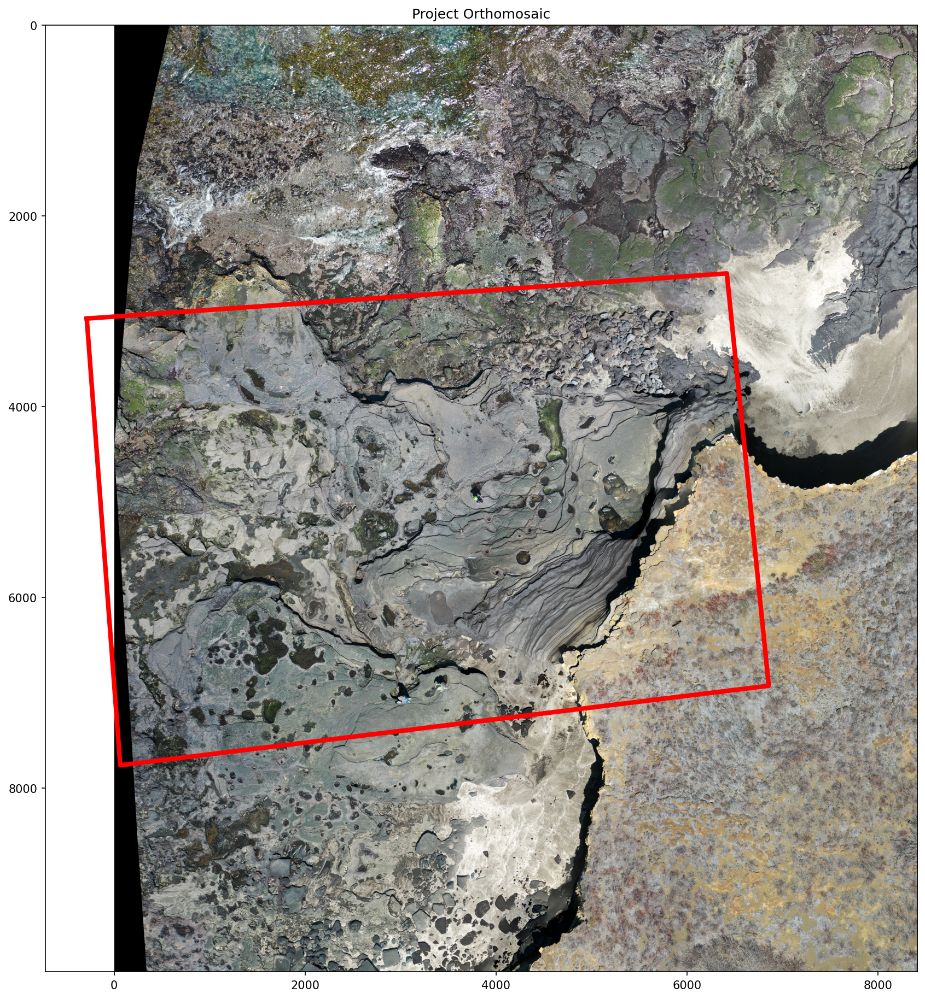

<Axes: title={'center': 'Project Orthomosaic'}>

In [74]:
from image_template_search.util.util import visualise_image, visualise_polygons
from image_template_search.image_patch_finder import ImagePatchFinderCV, ImagePatchFinderLG

ipf = ImagePatchFinderCV(template_path=drone_image_path,
                             large_image_path=orthomosaic_crop_path)

ipf.find_patch()
ax_i = visualise_image(image_path=ipf.large_image_path, show=False, dpi=150, title="Project Orthomosaic")
visualise_polygons(polygons=[ipf.proj_template_polygon], ax=ax_i, show=True, color="red", linewidth=4)

Use the the LightGLue Based Matching instead

In [ ]:

from image_template_search.util.util import visualise_image, visualise_polygons

ipf = ImagePatchFinderLG(template_path=drone_image_path,
                             large_image_path=orthomosaic_crop_path)

ipf.find_patch()
ax_i = visualise_image(image_path=ipf.large_image_path, show=False, dpi=150)
visualise_polygons(polygons=[ipf.proj_template_polygon], ax=ax_i, show=True, color="red", linewidth=4)

#### Step 3 - Warp the orthomosaic to the template extent

In [ ]:

from image_template_search.util.projection import project_image

projected_image_2_path = project_image(ipf.M, template_path=drone_image_path, large_image_path=orthomosaic_crop_path,
                                       output_path=output_path, visualise=True)

projected_image_2_path


#### Step 4 - Refined projection of the labes
Project labels from the template image to orthomosaic as an indicator where iguanas are.

In [ ]:

from examples.playground.find_template_and_project_labels import single_stage_template_matching_projection

projected_labels = single_stage_template_matching_projection(template_image_path=drone_image_path,
                                                           large_image_path=projected_image_2_path,
                                                           drone_image_labels=drone_image_label.labels)

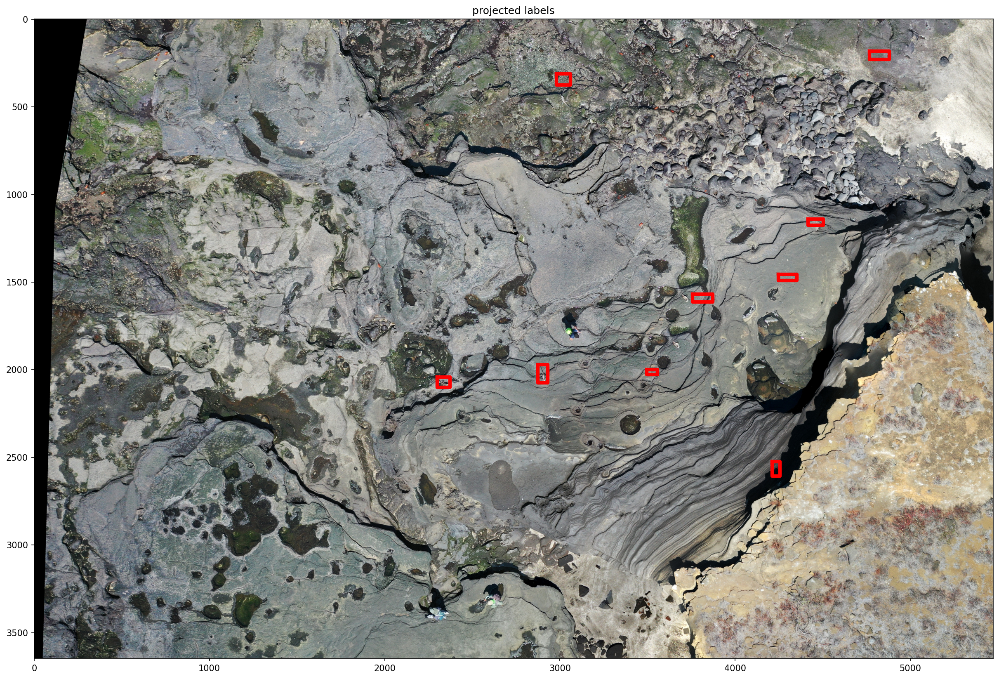

In [78]:
from matplotlib import pyplot as plt

ax_p = visualise_image(image_path=projected_image_2_path, show=False, title="projected labels", dpi=150)
ax_p = visualise_polygons(polygons=[x.bbox_polygon for x in projected_labels], ax=ax_p, linewidth=4, color="red", show=False)

plt.show()

In [79]:
projected_labels

[ImageLabel(id='099fbffc-89fa-411e-9384-1d95c934a4b0', class_name='iguana', bbox=[4212, 2523, 4256, 2606], polygon=None, mask=None, z_index=8, attributes={}, keypoints=[]),
 ImageLabel(id='1228ec2f-c320-4d5d-819d-c2eb1c15d177', class_name='iguana', bbox=[4767, 182, 4880, 228], polygon=None, mask=None, z_index=1, attributes={}, keypoints=[]),
 ImageLabel(id='15bb3c1a-6340-446f-af4d-3abc735c89b9', class_name='iguana', bbox=[3757, 1569, 3872, 1613], polygon=None, mask=None, z_index=4, attributes={}, keypoints=[]),
 ImageLabel(id='33ec285f-888f-45a9-b864-049f4bc963cb', class_name='iguana', bbox=[2300, 2041, 2373, 2101], polygon=None, mask=None, z_index=5, attributes={}, keypoints=[]),
 ImageLabel(id='4794f784-ef8c-4503-8066-fe76aae9639f', class_name='iguana', bbox=[4247, 1456, 4353, 1491], polygon=None, mask=None, z_index=3, attributes={}, keypoints=[]),
 ImageLabel(id='549c4018-4258-4f16-98a3-cbfb5ba33d62', class_name='iguana', bbox=[4416, 1139, 4503, 1176], polygon=None, mask=None, z_ind

#### Step 5 - create an Annotation for later use


In [80]:
from image_template_search.util.HastyAnnotationV2 import HastyAnnotationV2, AnnotatedImage
from PIL import Image as PILImage

image = PILImage.open(projected_image_2_path)
# Ensure the bounding box fits within the image dimensions
frame_width, frame_height = image.size


annotated_projected_image = AnnotatedImage(image_name=projected_image_2_path.name,
                                       height=frame_height, width=frame_width,
                                       labels=projected_labels)

# create the new annotation, duplicate the metadata of the original Annotation, because we just moved the annotations around. 
hA_projected = HastyAnnotationV2(label_classes=hA.label_classes, 
                       project_name="cutouts", 
                       images=[annotated_projected_image],
                       keypoint_schemas=hA.keypoint_schemas,
                       tag_groups=hA.tag_groups,
                       attributes=hA.attributes)

projected_annotation_path = output_path / f"template_annotations_projected.json"
combined_annotations_file_path = output_path / f"combined_annotations.json"

## TODO, use a unique name
with open(projected_annotation_path, 'w') as json_file:
    json_file.write(hA_projected.model_dump_json())
    logger.info(f"Wrote annotations to: {projected_annotation_path}")


2024-11-22 10:59:50.190 | INFO     | __main__:<module>:27 - Wrote annotations to: /Users/christian/Library/CloudStorage/GoogleDrive-christian.winkelmann@gmail.com/My Drive/Datasets/IguanasFromAbove/Orthomosaics for quality analysis/Snt_STJB06_12012023/output/template_annotations_projected.json


#### Step 6 - Refine the annotations using FiftyOne and CVAT
If the Orthomosaic is perfect and incorporated the drone image completely the annotation should match the single image.
Due to distortions or moved animals either animals will be missing, duplicated or simply somewhere else.

This can be corrected now.

In [81]:
projected_image_2_path

PosixPath('/Users/christian/Library/CloudStorage/GoogleDrive-christian.winkelmann@gmail.com/My Drive/Datasets/IguanasFromAbove/Orthomosaics for quality analysis/Snt_STJB06_12012023/output/matched_template_Snt_STJB06_12012023_DJI_0145_Snt_STJB06_12012023_orthomosaic_ODM_cropped.jpg')

In [82]:
import fiftyone as fo

from examples.review_annotations import debug_hasty_fiftyone

# annotations_file_path = base_path / "San_STJB01_10012023/template_images/methods_paper_labels_points.json"
# load hasty annotations
hA = hA_from_file(file_path=annotations_file_path)
hA_images = [i for i in hA.images if i.image_name in [drone_image_path.name]]

hA_projected = hA_from_file(file_path=projected_annotation_path)
hA_projected_images = [i for i in hA_projected.images if i.image_name in [projected_image_2_path.name]]



annotations_file_path

PosixPath('/Users/christian/Library/CloudStorage/GoogleDrive-christian.winkelmann@gmail.com/My Drive/Datasets/IguanasFromAbove/Orthomosaics for quality analysis/Snt_STJB06_12012023/template_images/labels.json')

In [83]:

hA.images = hA_images + hA_projected_images
images_set = [projected_image_2_path, drone_image_path]
assert len(hA.images) == 2, "There should be two images in there"

dataset_name = f"projection_comparison_{orthomosaic_path.stem}__{drone_image_path.stem}"
hA.save(combined_annotations_file_path)

shutil.copy(drone_image_path, output_path)



'/Users/christian/Library/CloudStorage/GoogleDrive-christian.winkelmann@gmail.com/My Drive/Datasets/IguanasFromAbove/Orthomosaics for quality analysis/Snt_STJB06_12012023/output/Snt_STJB06_12012023_DJI_0145.JPG'

In [84]:
import shutil
shutil.copy(drone_image_path, output_path)

'/Users/christian/Library/CloudStorage/GoogleDrive-christian.winkelmann@gmail.com/My Drive/Datasets/IguanasFromAbove/Orthomosaics for quality analysis/Snt_STJB06_12012023/output/Snt_STJB06_12012023_DJI_0145.JPG'

## Delete the dataset if it exists

In [85]:
## ONLY DELETE THIS IF YOU WANT TO START FROM SCRATCH
# fo.delete_dataset(dataset_name)


In [ ]:
# create dot annotations
dataset = debug_hasty_fiftyone(hA_dets=hA.images, hA_gt=hA.images, images_set=images_set, dataset_name=dataset_name, type="points")

## Launch FiftyOne inspection app
# session = fo.launch_app(dataset, port=5151)
# session.wait()

# sample_id = dataset.first().id
# view = dataset.select(sample_id)

In [ ]:
for i, s in enumerate(dataset):
    logger.info(f"sample {i} of the dataset")

In [ ]:
import os

os.environ["FIFTYONE_CVAT_USERNAME"] = "karisu"
os.environ["FIFTYONE_CVAT_PASSWORD"] = "Q6YRN7Z8Z4f5X4S"



In [ ]:
# Step 3: Send samples to CVAT

# A unique identifier for this run
# anno_key = f"cvat_basic_recipe_{orthomosaic_path.stem}"
anno_key = dataset_name

dataset.annotate(
    anno_key,
    # Using a organization requires a team account for 33USD
    # project_name = "Orthomosaic_quality_control",
    #organization=organization
    label_field="ground_truth_points",
    attributes=["iscrowd"],
    launch_editor=True,
)
print(dataset.get_annotation_info(anno_key))

#### Step 7 - change the annotations in CVAT
Review and update the labels on cvat.ai

 

#### Step 8 - download the annotations again
TODO 
Look into the human_in_the_loop_delete script